## Test LRP

In [674]:
import numpy as np
import sys
import glob
import importlib

import torch
from torch import nn

import matplotlib.pyplot as plt
import cartopy.crs as ccrs

from tqdm import tqdm_notebook as tqdm

In [611]:
# User Edits

# Indicate paths
datpath = "/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/03_Scripts/CESM_data/"
modpath = datpath + "Models/FNN2_quant0/"
figpath = "/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/"

# Indicate settings
detrend = 0

# Load modules (LRPutils by Peidong)
sys.path.append("/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/03_Scripts/scrap/")
sys.path.append("/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/03_Scripts/predict_amv/")
import LRPutils as utils
import amvmod as am

# Plotting Settings
vnames     = ("SST","SSS","SLP")
thresnames = ("AMV+","Neutral","AMV-",)

# Model Parameters (copied from NN_test_lead_ann_ImageNet_classification.py)
inputsize   = 3*224*224
outsize     = len(thresholds) + 1
nlayers     = 2
nunits      = [20,20]
activations = [nn.ReLU(),nn.ReLU()]
dropout     = 0.5

In [612]:
# Reload modules if necessary
importlib.reload(utils)
importlib.reload(am)

<module 'amvmod' from '/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/03_Scripts/predict_amv/amvmod.py'>

In [613]:
%%time

# Load in input and labels 
data   = np.load(datpath+ "CESM_data_sst_sss_psl_deseason_normalized_resized_detrend%i.npy" % detrend) # [variable x ensemble x year x lon x lat]
target = np.load(datpath+ "CESM_label_amv_index_detrend%i.npy" % detrend)
data.shape, target.shape

CPU times: user 2.17 ms, sys: 956 ms, total: 959 ms
Wall time: 970 ms


((3, 40, 86, 224, 224), (40, 86))

In [614]:
# Load lat/lon and other needed data

lat2 = np.load("%slat_2deg_NAT.npy"% (datpath))
lon2 = np.load("%slon_2deg_NAT.npy"% (datpath))

lat  = np.linspace(lat2[0],lat2[-1],data.shape[4])
lon  = np.linspace(lon2[0],lon2[-1],data.shape[3])


In [615]:
# Load the models and weights

modlist = glob.glob("%s*.pt" % (modpath))

modlist.sort()

#print(*modlist,sep="\n")
print(*modlist[:10],sep="\n")

/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/03_Scripts/CESM_data/Models/FNN2_quant0/AMVClass3_FNN2_nepoch20_nens40_maxlead24_detrend0_noise0_unfreeze_allTrue_run0_unfreezeall_quant0_ALL_lead0_classify.pt
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/03_Scripts/CESM_data/Models/FNN2_quant0/AMVClass3_FNN2_nepoch20_nens40_maxlead24_detrend0_noise0_unfreeze_allTrue_run0_unfreezeall_quant0_ALL_lead12_classify.pt
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/03_Scripts/CESM_data/Models/FNN2_quant0/AMVClass3_FNN2_nepoch20_nens40_maxlead24_detrend0_noise0_unfreeze_allTrue_run0_unfreezeall_quant0_ALL_lead15_classify.pt
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/03_Scripts/CESM_data/Models/FNN2_quant0/AMVClass3_FNN2_nepoch20_nens40_maxlead24_detrend0_noise0_unfreeze_allTrue_run0_unfreezeall_quant0_ALL_lead18_classify.pt
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/03_Scripts/CESM_data/Models/FNN2_quant0/AMVClass3_FN

## Testing with 1 model

In [616]:
# Load 1 module as a test. Get its weights and biases
imodel = 14
mod    = torch.load(modlist[imodel])
mod

Ws,Bs  = utils.get_weight(mod)

Ws[0].shape#,Bs

print(modlist[imodel])
[print("Ws[%i].shape = %s" % (z,Ws[z].shape)) for z in range(len(Ws))]
[print("Bs[%i].shape = %s" % (z,Bs[z].shape)) for z in range(len(Bs))]

/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/03_Scripts/CESM_data/Models/FNN2_quant0/AMVClass3_FNN2_nepoch20_nens40_maxlead24_detrend0_noise0_unfreeze_allTrue_run1_unfreezeall_quant0_ALL_lead24_classify.pt
Ws[0].shape = (20, 150528)
Ws[1].shape = (20, 20)
Ws[2].shape = (3, 20)
Bs[0].shape = (20,)
Bs[1].shape = (20,)
Bs[2].shape = (3,)


[None, None, None]

In [617]:
# Reconstruct the model and load in the weights
layers = am.build_FNN_simple(inputsize,outsize,nlayers,nunits,activations,dropout=0.5)
pmodel = nn.Sequential(*layers)

pmodel.load_state_dict(mod)
pmodel.eval()
pmodel

Sequential(
  (0): Linear(in_features=150528, out_features=20, bias=True)
  (1): ReLU()
  (2): Linear(in_features=20, out_features=20, bias=True)
  (3): ReLU()
  (4): Dropout(p=0.5, inplace=False)
  (5): Linear(in_features=20, out_features=3, bias=True)
)

In [618]:
# Scrap to remind myself how pytorch models work...
input_data = torch.from_numpy(X[:20,:,:,:].reshape(20,nchannels*nlat*nlon))
_,pred     = torch.max(pmodel(input_data),1)
# print(pred.shape)
pred # == y_class[:20]

tensor([0, 0, 1, 2, 2, 1, 0, 2, 2, 0, 1, 2, 2, 1, 2, 2, 2, 2, 0, 0])

In [619]:
# Apply lead/lag and restrict sample
lead       = 24
ens        = 40
tstep      = 86
quantile   = False
thresholds = [-1,1]

y                            = target[:ens,lead:].reshape(ens*(tstep-lead),1)
X                            = (data[:,:ens,:tstep-lead,:,:]).reshape(3,ens*(tstep-lead),224,224).transpose(1,0,2,3)
nsamples,nchannels,nlon,nlat = X.shape
print(y.shape),print(X.shape)

# Make the labels
y_class = am.make_classes(y,thresholds,reverse=True,quantiles=quantile)
if quantile == True:
    thresholds = y_class[1].T[0]
    y_class   = y_class[0]
if (nsamples is None) or (quantile is True):
    nthres = len(thresholds) + 1
    threscount = np.zeros(nthres)
    for t in range(nthres):
        threscount[t] = len(np.where(y_class==t)[0])
    nsamples = int(np.min(threscount))
print(y_class.shape)

(2480, 1)
(2480, 3, 224, 224)
Class 2 Threshold is y <= -0.39 
Class 1 Threshold is -0.39 < y <= 0.39 
Class 0 Threshold is y > 0.39 
(2480, 1)


In [620]:
# Input into LRP 
isample = 2223
epsilon = 0.25 * 0.36
gamma   = 0.25

out     = utils.LRP_single_sample(X[isample,:,:,:].flatten(),Ws,Bs,epsilon,gamma)
out     = out.reshape(nchannels,nlon,nlat)

label   = int(y_class[isample])
print("%s, AMV Index=%.3f" % (thresnames[label],y[isample]))

AMV+, AMV Index=0.478


/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRPRelevance_samp2223_lead24_AMV+_gamma0.250_epsilon0.090_vmax0.002.png


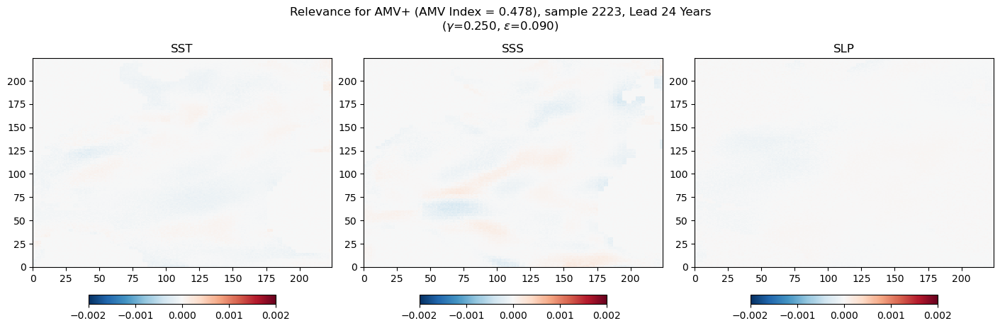

In [621]:
# Visualize the output of LRP

vmax = 0.002

fig,axs = plt.subplots(1,3,figsize=(14,4),constrained_layout=True)
for ch in range(3):
    ax = axs[ch]
    if vmax is None:
        pcm = ax.pcolormesh(out[ch,:,:],cmap='RdBu_r',)
    else:
        pcm = ax.pcolormesh(out[ch,:,:],cmap='RdBu_r',vmin=-vmax,vmax=vmax)
    ax.set_title(vnames[ch])
    fig.colorbar(pcm,ax=ax,fraction=0.045,orientation='horizontal')

plt.suptitle("Relevance for %s (AMV Index = %.3f), sample %i, Lead %i Years\n" % (thresnames[label],y[isample],isample,lead)+"($\gamma$=%.3f, $\epsilon$=%.3f)"%(gamma,epsilon),y=1.12)
(figpath,isample,lead,thresnames[label],gamma,epsilon,vmax)
savename = "%sLRPRelevance_samp%03i_lead%i_%s_gamma%.3f_epsilon%.3f_vmax%.3f.png" % (figpath,isample,lead,thresnames[label],gamma,epsilon,vmax)
print(savename)
plt.savefig(savename,dpi=150,bbox_inches='tight')

## For a given lead time and model, load all model data in and calculate the relevance

In [622]:
%%time

# User Edits (select gamma and epsilon)
epsilon    = 0.25 * 0.36
gamma      = 0.25

# Preallocation
nthres     = len(thresholds) + 1 # Loop for each threshold
relevances = []                  # Relevances for each threshold [[class1],[class2],[class3]], where [class1].shape = [sample,channel,lon,lat]
ids        = []                  # Indices of each threshold

x_in       = X.reshape(nsamples,nchannels*nlat*nlon) # Flatten to [sample x otherdims]
y_pred     = np.zeros((nsamples,1)) # Predictions [sample,1]
for th in range(nthres):
    
    # Select only the samples for that class
    ithres  = np.where(y_class==th)[0]
    x_class = x_in[ithres,:]
    x_size  = x_class.shape[0]
    
    # Preallocate to store relevances
    rel_x   = np.zeros(x_class.shape)
    
    # Calculate relevance for each sample for the selected class
    for x in trange(x_size):
        
        rel = utils.LRP_single_sample(x_class[x],Ws,Bs,epsilon,gamma)
        rel_x[x,:] = rel.copy() # 
    
    # Reshape output to [sample x channel x lon x lat] and store
    relevances.append(rel_x.reshape(x_size,nchannels,nlon,nlat))
    ids.append(ithres)
    
    # Reevaluate the model and obtain the predictions
    #print(x_class.shape)
    y_out = pmodel(torch.from_numpy(x_class))
    _,y_out = torch.max(y_out,1) # Take maximum along the class dimension, and output the indices
    y_pred[ithres,0] = y_out
    #print(y_out)


  0%|          | 0/426 [00:00<?, ?it/s]

  0%|          | 0/1689 [00:00<?, ?it/s]

  0%|          | 0/365 [00:00<?, ?it/s]

CPU times: user 5min 56s, sys: 1min 31s, total: 7min 27s
Wall time: 58.7 s


In [623]:
len(relevances[0])

426

In [624]:
# Re-check the accuracy for each class
ncorrect    = (y_pred == y_class).sum()
acc_total   = ncorrect/nsamples
acc_byclass = []
for th in range(3):
    ithres   = np.where(y_class == th)[0]
    ncorrect = (y_pred[ithres] == y_class[ithres]).sum()
    acc_byclass.append(ncorrect/y_class[ithres].shape[0])
    print("Accuracy for %s is %.3f" % (thresnames[th],acc_byclass[th]))
print("Total Accuracy is %.3f" % (acc_total))

correct = (y_pred==y_class)
#y_pred.shape[0]

Accuracy for AMV+ is 0.629
Accuracy for Neutral is 0.150
Accuracy for AMV- is 0.781
Total Accuracy is 0.325


/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRP_sample_lead24_AMV+_SST_gamma0.250_epsilon0.090_istart617.png
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRP_sample_lead24_AMV+_SSS_gamma0.250_epsilon0.090_istart617.png
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRP_sample_lead24_AMV+_SLP_gamma0.250_epsilon0.090_istart617.png
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRP_sample_lead24_Neutral_SST_gamma0.250_epsilon0.090_istart1925.png
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRP_sample_lead24_Neutral_SSS_gamma0.250_epsilon0.090_istart1925.png
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRP_sample_lead24_Neutral_SLP_gamma0.250_epsilon0.090_istart1925.png
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRP_sample_lead24_AMV-_SST_gamm

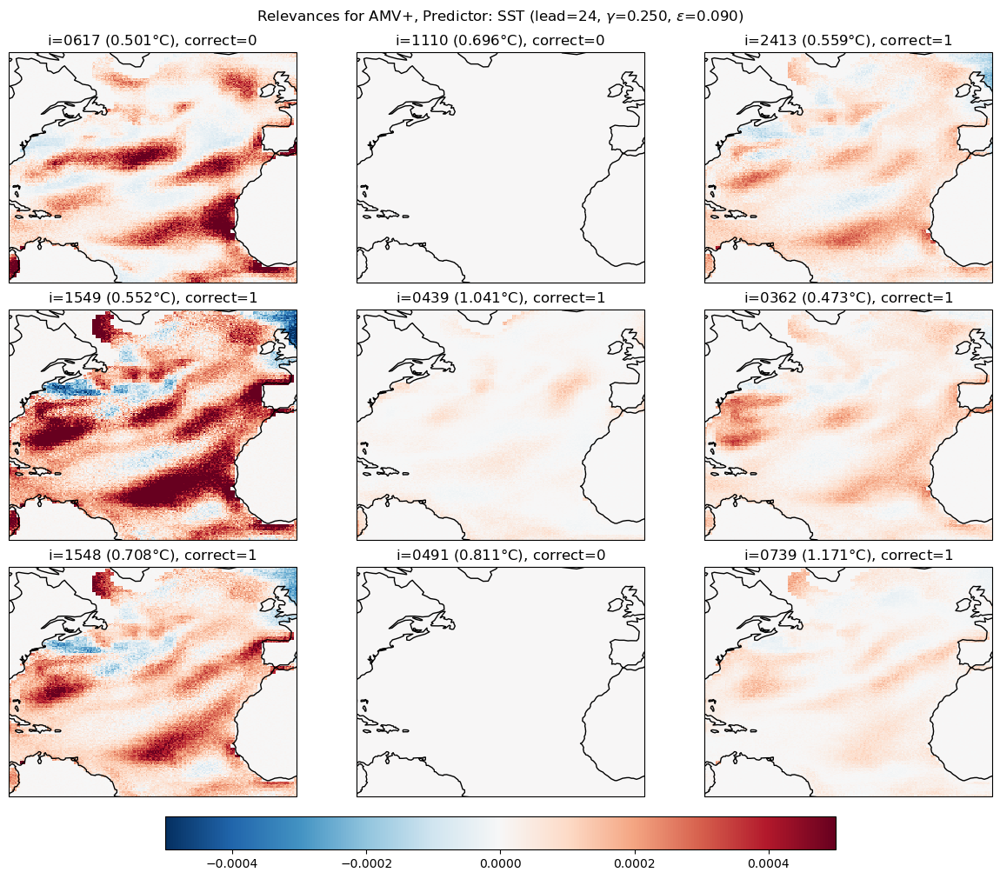

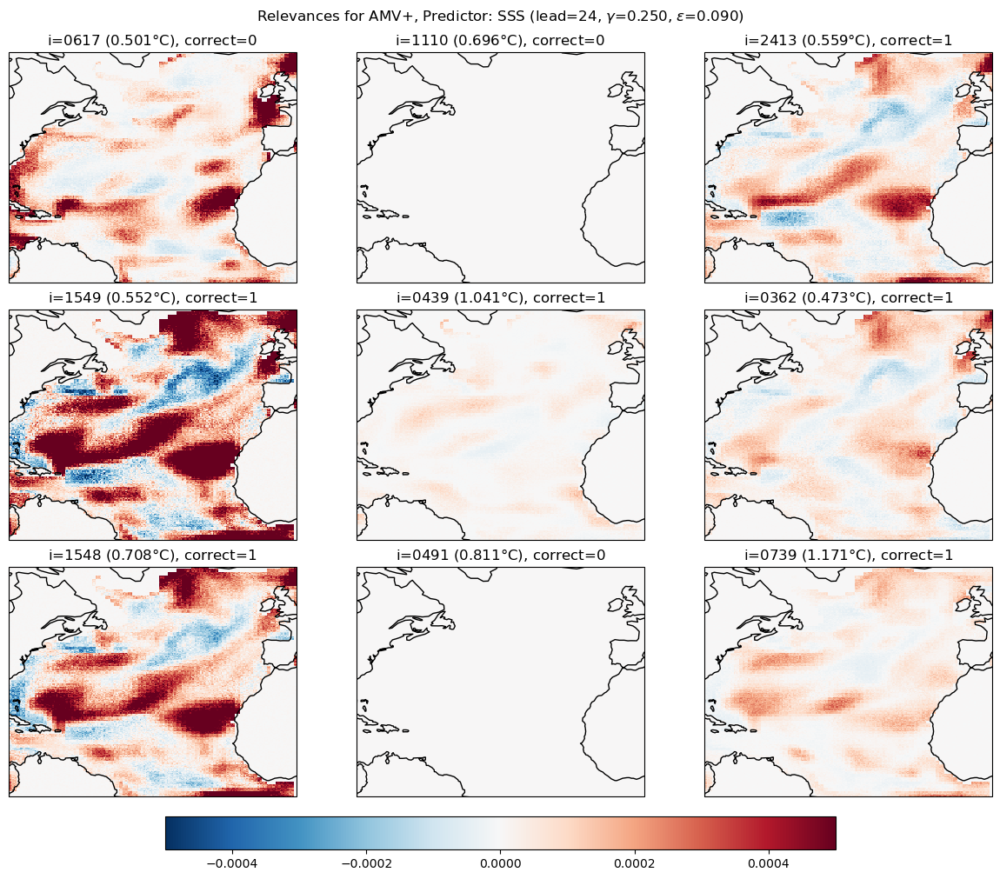

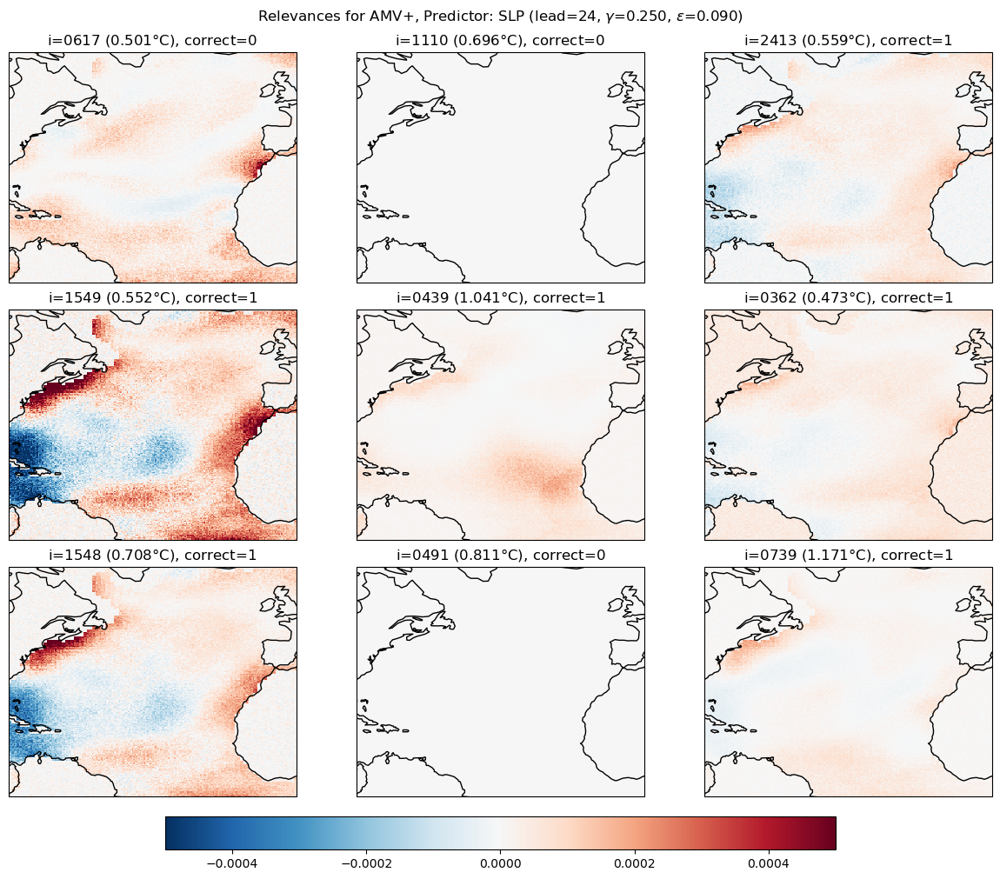

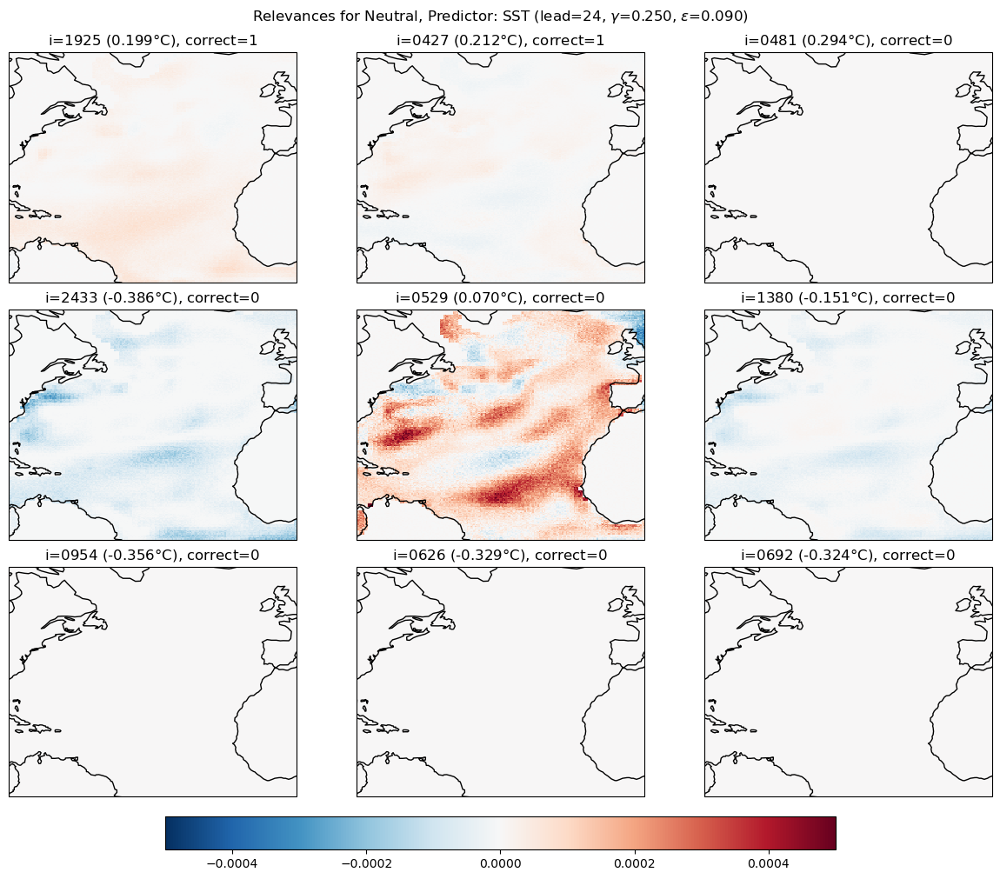

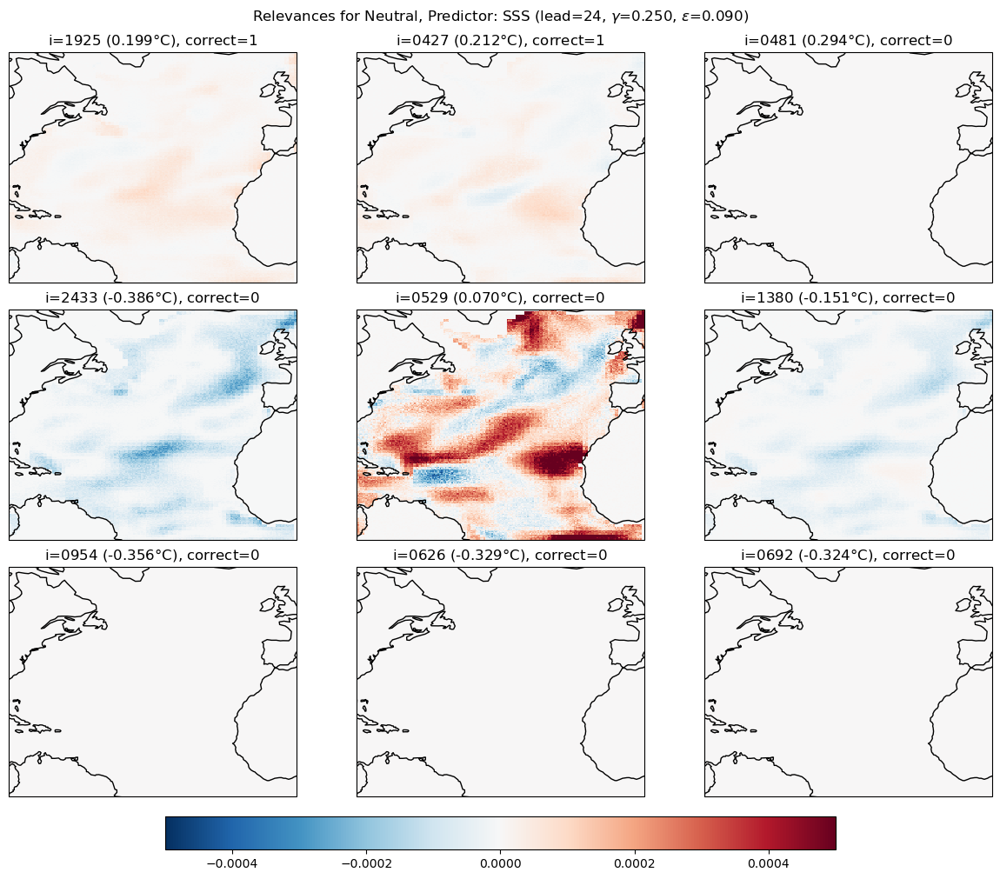

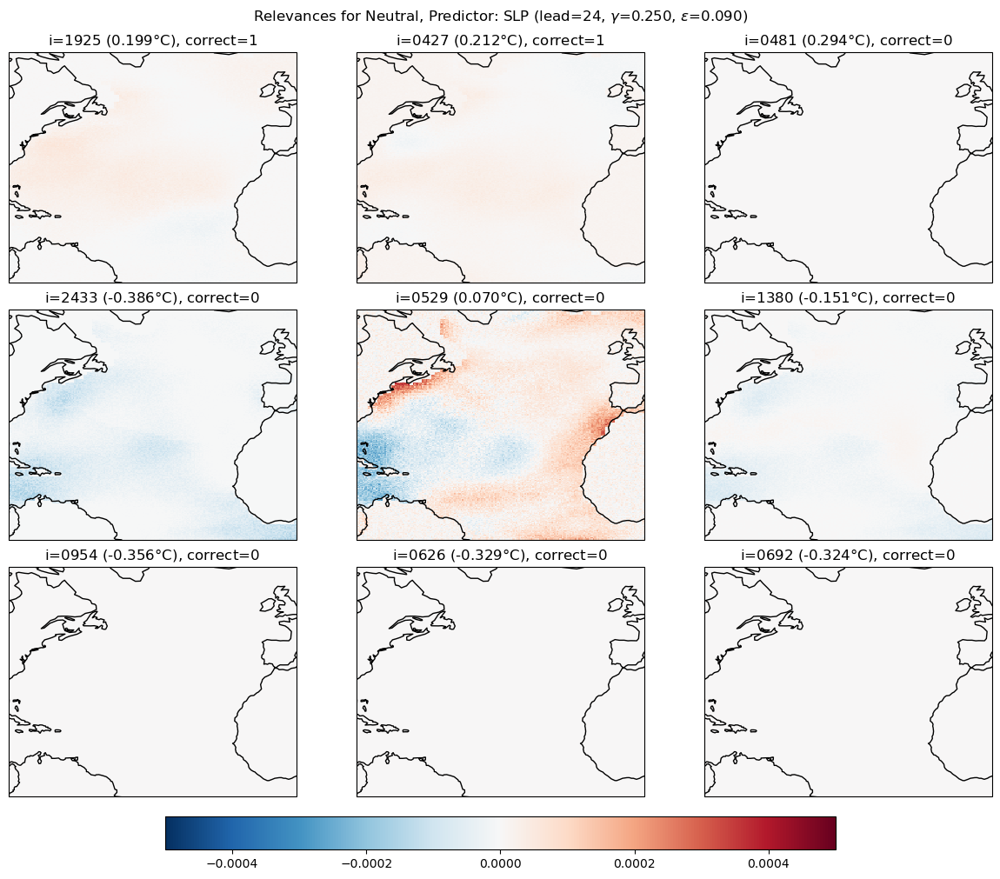

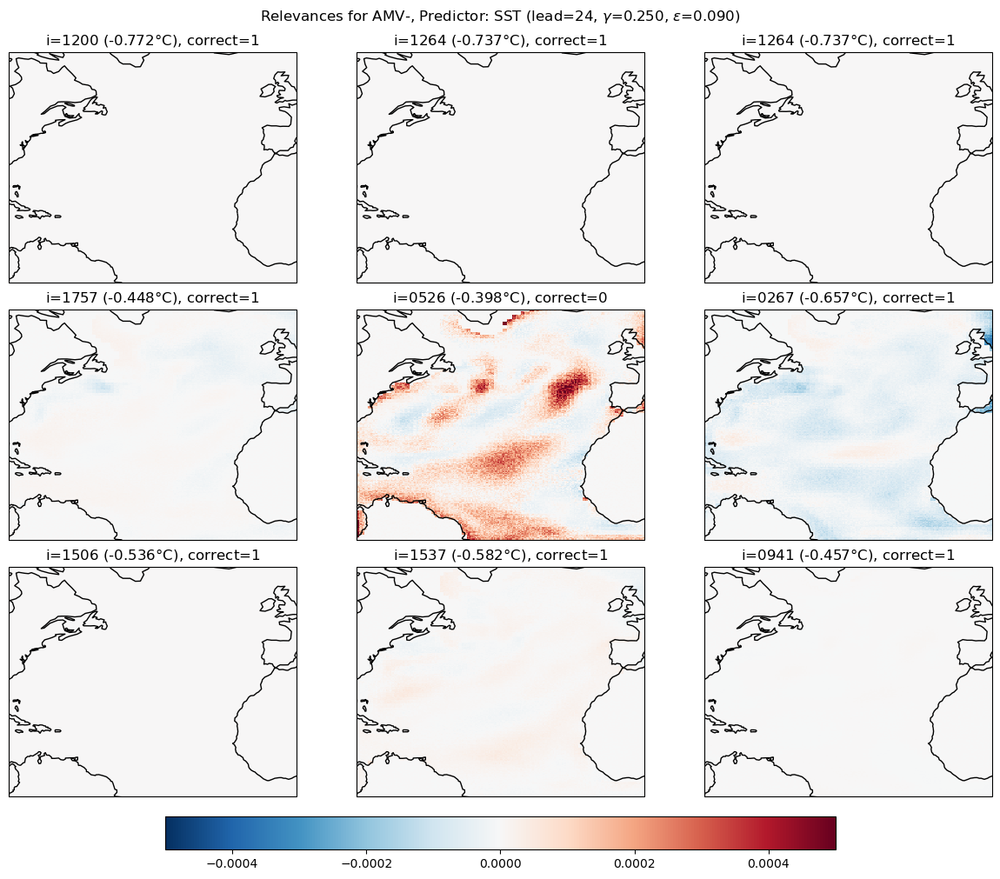

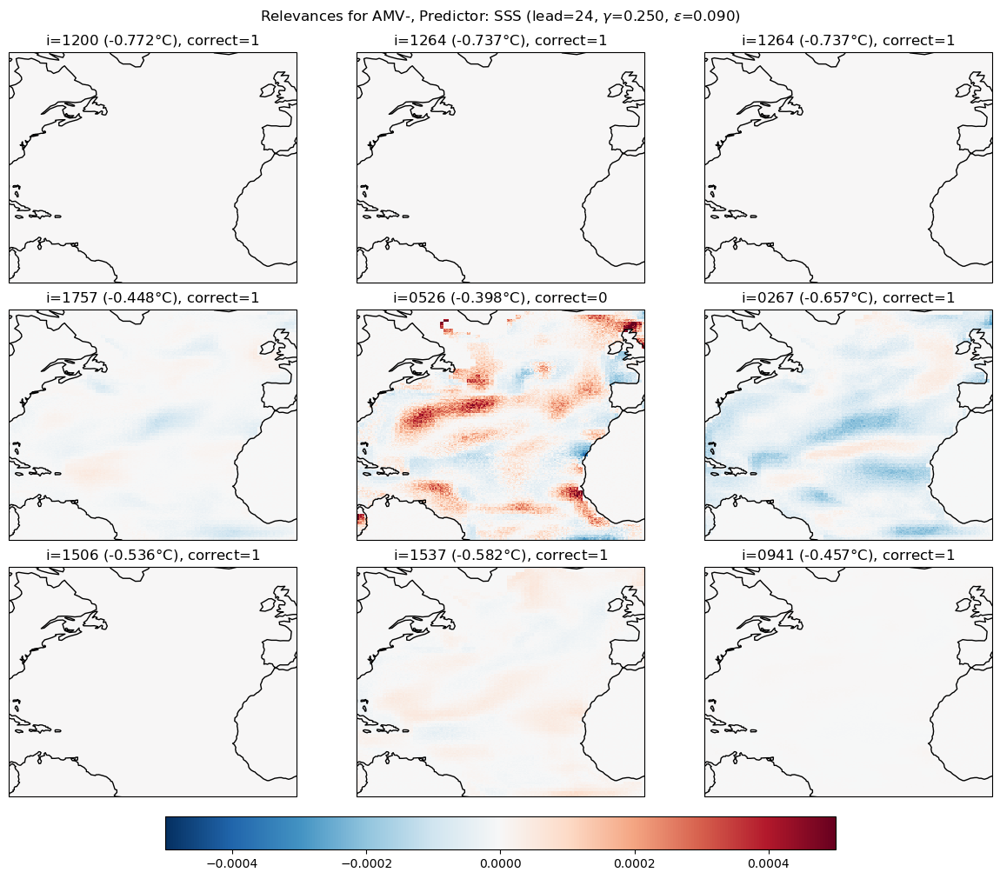

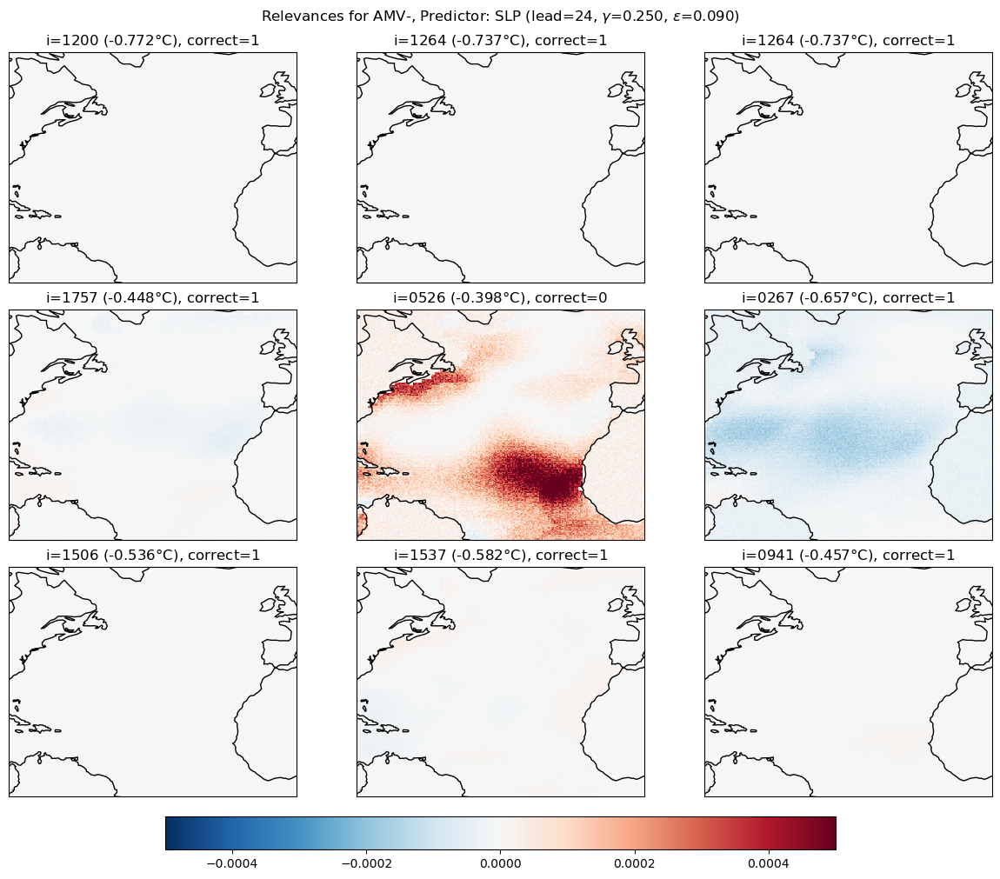

In [625]:
# Plot relevances for a selected variable and class, random 9 samples
vmax   = 0.0005
th     = 1
ivar   = 0
rand_ithres = np.random.choice(np.arange(0,ids[th].shape[0]),9)
#rand_ithres[0]
#relevances[th][rand_ithres[a]]

for th in range(nthres):
    rand_ithres = np.random.choice(np.arange(0,ids[th].shape[0]),9)
    #print("th=%i"%th)
    for ivar in range(3):
        #print("ivar=%i"%ivar)
        fig,axs     = plt.subplots(3,3,constrained_layout=True,figsize=(12,10),
                                   subplot_kw={'projection':ccrs.PlateCarree()})
        isamples = []
        for a,ax in enumerate(axs.flatten()):
            #print("a=%i"%a)
            #print(rand_ithres[a])
            plotvar = relevances[th][rand_ithres[a]][ivar,:,:]
            plotvar.shape
            #plotvar.shape
            pcm = ax.pcolormesh(lon,lat,plotvar,cmap='RdBu_r',vmin=-vmax,vmax=vmax)
            ax.coastlines()
            isample = ids[th][rand_ithres[a]]
            ax.set_title("i=%04i (%.3f$\degree$C), correct=%i" % (isample,y[isample,:],correct[isample]))
            isamples.append(isample)
        plt.suptitle("Relevances for %s, Predictor: %s (lead=%i, " % (thresnames[th],vnames[ivar],lead,) + "$\gamma$=%.3f, $\epsilon$=%.3f)"%(gamma,epsilon) )
        fig.colorbar(pcm,ax=axs.flatten(),fraction=0.045,orientation='horizontal',pad=0.025)

        savename = "%sLRP_sample_lead%i_%s_%s_gamma%.3f_epsilon%.3f_istart%i.png" % (figpath,lead,thresnames[th],vnames[ivar],gamma,epsilon,isamples[0])
        print(savename)

        plt.savefig(savename,dpi=150,bbox_inches='tight')

In [ ]:
th     = 0
ithres = np.where(y_class==th)[0]
X[ithres,:,:,:].shape

In [ ]:
np.random.choice(ids[th],9)

In [666]:
y_values.shape

(40, 62)

62

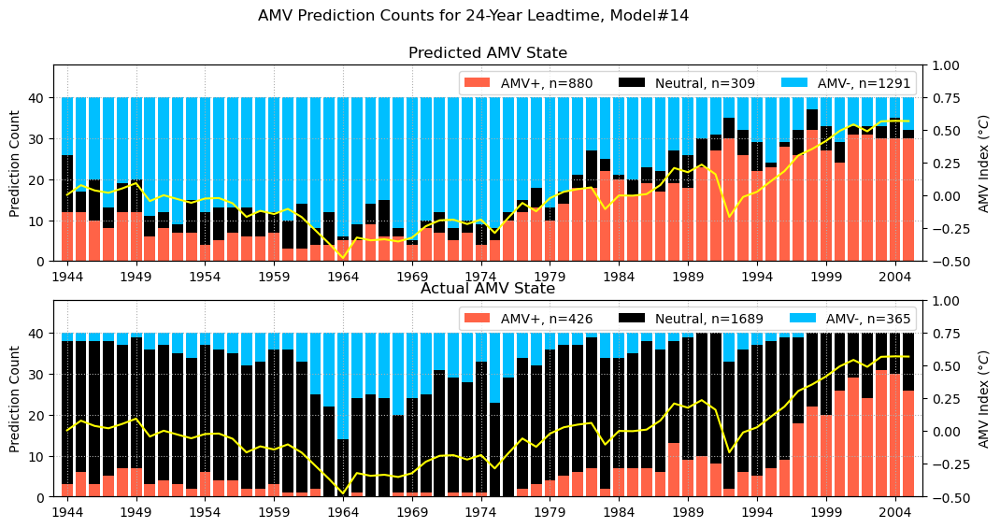

In [672]:
# Make a bar plot for the timescales of the prediction

yrs    = np.arange(lead,86)
xtks   = np.arange(lead,86+5,5)

plotcolors = ["tomato","k","deepskyblue"]
#target[:ens,lead:].reshape(ens*(tstep-lead),1)

y_pred.shape, y_class.shape
oldshape  = (ens,tstep-lead)
y_predos  = y_pred.reshape(oldshape)
y_classos = y_class.reshape(oldshape) # [ens,]
y_values  = y.reshape(oldshape)
#y_values.shape

counts_pred = am.get_barcount(y_predos,axis=0)
counts_targ = am.get_barcount(y_classos,axis=0)

fig,axs = plt.subplots(2,1,figsize=(12,6))
ax       = axs[0]

# for e in range(ens):
#     sc = ax.scatter(yrs,y_values[e,:],c=y_predos[e,:],alpha=0.2,cmap="RdBu_r")

# Lets just first plot the model predictions
for a,ax in enumerate(axs):
    if a == 0:
        counts = counts_pred
        title  = "Predicted AMV State"
    else:
        counts = counts_targ
        title  = "Actual AMV State"
        
    for th in range(3):

        plotvar = counts[th]
        if th > 0:
            bottom = np.array(counts[:th]).sum(0)
        else:
            bottom = None
    
        ax.bar(yrs,plotvar,label=thresnames[th] + ", n=%i" % (plotvar.sum()),bottom=bottom,color=plotcolors[th],)
    ax.legend(ncol = 3)
    ax.set_ylim(0,ens+8)
    
    ax2 = ax.twinx()
    ax2.plot(yrs,y_values.mean(0),c='yellow')
    ax2.set_ylim([-.5,1])
    ax2.set_ylabel("AMV Index ($\degree C$)")
    
    ax.set_title(title)
    ax.set_xticks(xtks)
    ax.set_xticklabels(1920+np.array(xtks))
    ax.set_xlim([yrs[0]-1,yrs[-1]+1])
    ax.grid(True,ls='dotted')
    ax.set_ylabel("Prediction Count")
plt.suptitle("AMV Prediction Counts for %i-Year Leadtime, Model#%i" % (lead,imodel))

savename = "%sAMVPredictionCounts_lead%02i_model%02i.png" % (figpath,lead,imodel)
plt.savefig(savename,dpi=150,bbox_inches='tight')
#fig.colorbar(sc,ax=ax)
    #ax.plot(yrs,y_classos[e,:],alpha=0.5)

#ax.scatter(y_classos.flatten(),y_predos.flatten())


len(yrs)

In [627]:
# Confusion matrix

y_pred.shape,y_class.shape, correct.shape

# Old stuff (not really confmat, just counts...)
cm         = np.zeros((3,3))*np.nan
predcount  = cm.copy()
classcount = cm.copy()

# Preallocate for confusion matrices
cm_ids     = np.empty((3,2,2,nsamples),dtype='object')# Confusion matrix Boolean indices [Class,Actual_class,Pred_class,Indices]
cm_counts  = np.empty((3,2,2),dtype='object') # Counts of predicted values for each      [Class,Actual_class,Pred_class]
cm_totals  = cm_counts.copy() # Total count (for division)
cm_acc     = cm_counts.copy() # Accuracy values
cm_names   = ["TP","FP","FN","TN"] # Names of each

# Labeling for heatmaps
sanity_labels = [] # Just indicates which the predicted/actual class is to make sure ordering is right
labels        = [] # Actual, Predicted, Percentage
for th_targ in range(3): # For each class...
    
    print(th_targ)
    # Subset to cases of a particular class from the actual data
    ithres_targ   = np.where(y_class == th_targ)[0]  # id for years where AMV was in that state
    #print(ithres_targ)
    y_class_count = len(y_class[ithres_targ])
    
    # Old Script
    #print("Count for class %i is %i" % (th_targ,y_class_count))
    y_pred_in     = y_pred[ithres_targ,]
    #print("Predicted count for class %i is %i" % (th_targ,y_pred_in.shape[0]))
    for th_pred in range(3):
        
        ithres_pred  = np.where(y_pred_in == th_pred)[0]
        y_pred_count = len(y_pred_in[ithres_pred])
        #print("\tPredicted %i : %i times" % (th_pred,y_pred_count))
        
        acc = y_pred_count/y_class_count
        cm[th_targ,th_pred]         = acc
        predcount[th_targ,th_pred]  = len(np.where(y_pred == th_pred)[0])
        classcount[th_targ,th_pred] = y_class_count
        
        sanity_labels.append("Actual=%i,\n Predicted=%i" % (th_targ,th_pred))
        
        labels.append("Actual=%i,\nPredicted=%i,\nPerc.=%.2f"% (y_class_count,y_pred_count,acc*100)+"%")
    
    
    # New Script
    confmat,ccounts,tcounts,acc = am.calc_confmat(y_pred,y_class,th_targ)
    cm_ids[th_targ,:,:]    = confmat.copy()
    cm_counts[th_targ,:,:] = ccounts.copy()
    cm_totals[th_targ,:,:] = tcounts.copy()
    cm_acc[th_targ,:,:]    = acc.copy()

0
Predict 0: 1600, Actual 0: 2054, TN Count: 1442 
Predict 1: 880, Actual 1: 426, TP Count: 268 
Predict 1: 880, Actual 0: 2054, FP Count: 612 (+ 268 = 880 total)
Predict 0: 1600, Actual 1: 426, FN Count: 158 (+ 1442 = 1600 total)
1
Predict 0: 2171, Actual 0: 791, TN Count: 735 
Predict 1: 309, Actual 1: 1689, TP Count: 253 
Predict 1: 309, Actual 0: 791, FP Count: 56 (+ 253 = 309 total)
Predict 0: 2171, Actual 1: 1689, FN Count: 1436 (+ 735 = 2171 total)
2
Predict 0: 1189, Actual 0: 2115, TN Count: 1109 
Predict 1: 1291, Actual 1: 365, TP Count: 285 
Predict 1: 1291, Actual 0: 2115, FP Count: 1006 (+ 285 = 1291 total)
Predict 0: 1189, Actual 1: 365, FN Count: 80 (+ 1109 = 1189 total)


In [684]:
th_targ.

(2480, 1)

array([[0.11491935483870967, 0.4056451612903226],
       [0.03225806451612903, 0.44717741935483873]], dtype=object)

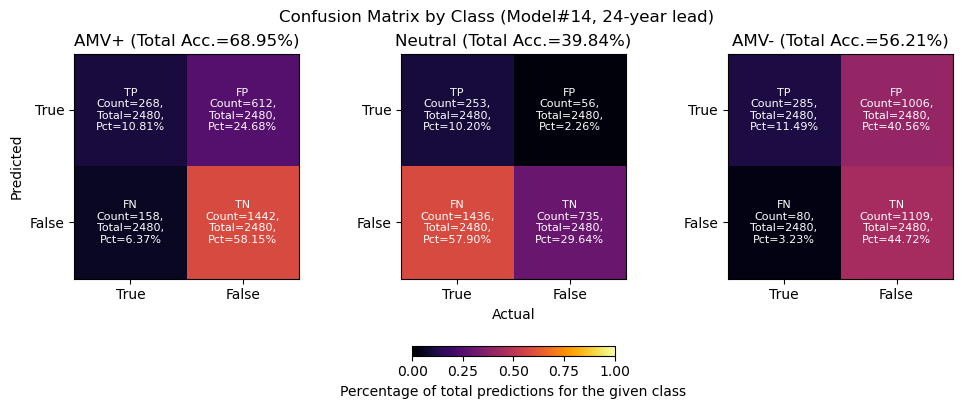

In [628]:
# Plot Confusion Matrices

fig,axs = plt.subplots(1,3,figsize=(10,4),constrained_layout=True)

for th in range(3):
    ax      = axs[th]
    plotvar = cm_acc[th,:,:].astype(np.float64)
    im      = ax.imshow(plotvar,cmap='inferno',vmin=0,vmax=1)
    
    labels  = ["%s\nCount=%i,\nTotal=%i,\nPct=%.2f"% (cm_names[c],cm_counts[th].flatten()[c],cm_totals[th].flatten()[c],plotvar.flatten()[c]*100) for c in range(4)]
    n = 0
    for i in range(2):
        for j in range(2):
            text = ax.text(j, i, labels[n]+"%",fontsize=8,
                           ha="center", va="center", color="w")
            n+=1
        
    
    ax.set_title(thresnames[th]+" (Total Acc.=%.2f"%(np.diag(cm_counts[th]).sum()/nsamples*100)+"%)")
    ax.set_xticks([0,1])
    ax.set_yticks([0,1])
    ax.set_xticklabels(["True","False"])
    ax.set_yticklabels(["True","False"])
    if th == 1:
        ax.set_xlabel("Actual")
    if th == 0:
        ax.set_ylabel("Predicted")
cb       = fig.colorbar(im,ax=axs.flatten(),fraction=0.045,pad=0.10,orientation='horizontal')
cb.set_label("Percentage of total predictions for the given class")
plt.suptitle("Confusion Matrix by Class (Model#%i, %i-year lead)" % (imodel,lead))
savename = "%sAMVPrediction_ConfusionMatrix_lead%02i_model%02i.png" % (figpath,lead,imodel)
plt.savefig(savename,dpi=150,bbox_inches='tight')
cm_acc[th,:,:]

# Make composites based on confusion matrices


In [675]:
# # Calculate the composites

# Do some reshaping
cm_ids         = cm_ids.reshape(3,4,nsamples) #[3 x 2 x 2 x samples] to [3 x 4 x samples]


# Re-arrange LRP maps into [sample x channel x lat x lon]
rel_maps = np.zeros((nsamples,nchannels,nlat,nlon))
for th in range(3):
    rel_maps[ids[th],:,:,:] = relevances[th]

lrp_composites = np.zeros((nthres,4,nchannels,nlat,nlon)) * np.nan # [threshold,confmat_quadrant,variable,lon,lat]
x_composites = lrp_composites.copy()

for th in range(3):
    for c in tqdm(range(4)):
        # Select relevances for the given confmat quadrant and threshold and take the mean
        ids_sel                    = cm_ids[th,c].astype(bool)
        sel_rel                    = rel_maps[ids_sel,:,:,:].mean(0) # [samples x channel x lon x lat]
        
        lrp_composites[th,c,:,:,:] = sel_rel.copy()
        x_composites[th,c,:,:,:]   = X[ids_sel,:,:,:].mean(0)

/var/folders/x8/zvr23m0j5d99631yj_zkcd5m0000gn/T/ipykernel_25536/4114246160.py:23: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for c in tqdm(range(4)):


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

In [673]:
X.shape

(2480, 3, 224, 224)

In [ ]:
#print("a=%i"%a)
            #print(rand_ithres[a])
            plotvar = relevances[th][rand_ithres[a]][ivar,:,:]
            plotvar.shape
            #plotvar.shape
            pcm = ax.pcolormesh(lon,lat,plotvar,cmap='RdBu_r',vmin=-vmax,vmax=vmax)
            ax.coastlines()
            isample = ids[th][rand_ithres[a]]
            ax.set_title("i=%04i (%.3f$\degree$C), correct=%i" % (isample,y[isample,:],correct[isample]))
            isamples.append(isample)
        plt.suptitle("Relevances for %s, Predictor: %s (lead=%i, " % (thresnames[th],vnames[ivar],lead,) + "$\gamma$=%.3f, $\epsilon$=%.3f)"%(gamma,epsilon) )
        fig.colorbar(pcm,ax=axs.flatten(),fraction=0.045,orientation='horizontal',pad=0.025)

        savename = "%sLRP_sample_lead%i_%s_%s_gamma%.3f_epsilon%.3f_istart%i.png" % (figpath,lead,thresnames[th],vnames[ivar],gamma,epsilon,isamples[0])
        print(savename)

        plt.savefig(savename,dpi=150,bbox_inches='tight')

/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRP_confmat_composite_lead24_SST_gamma0.250_epsilon0.090_istart1200_model14.png
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRP_confmat_composite_lead24_SSS_gamma0.250_epsilon0.090_istart1200_model14.png
/Users/gliu/Downloads/02_Research/01_Projects/04_Predict_AMV/02_Figures/20221007/LRP_confmat_composite_lead24_SLP_gamma0.250_epsilon0.090_istart1200_model14.png


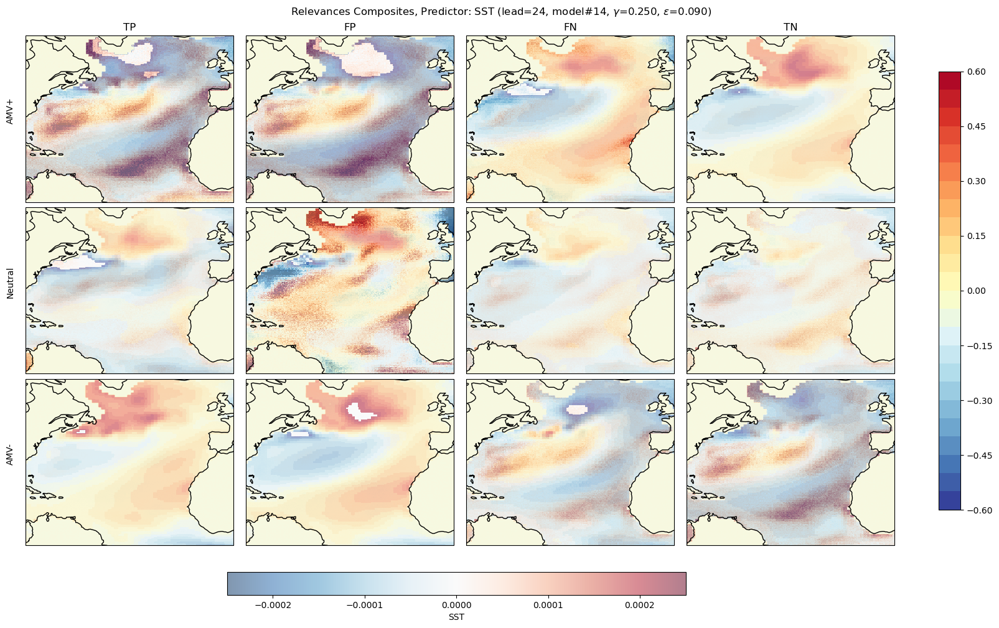

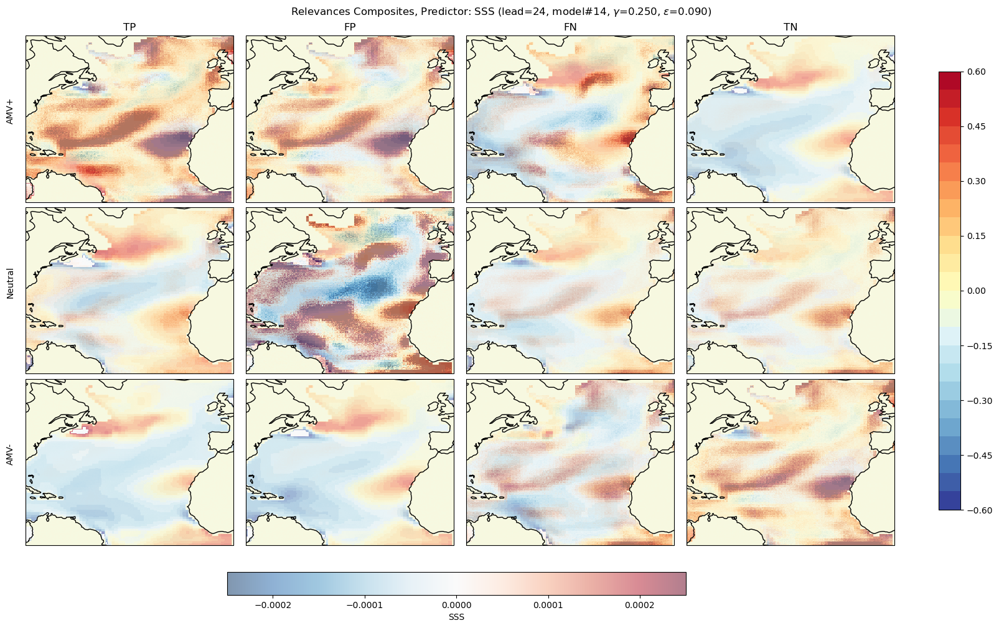

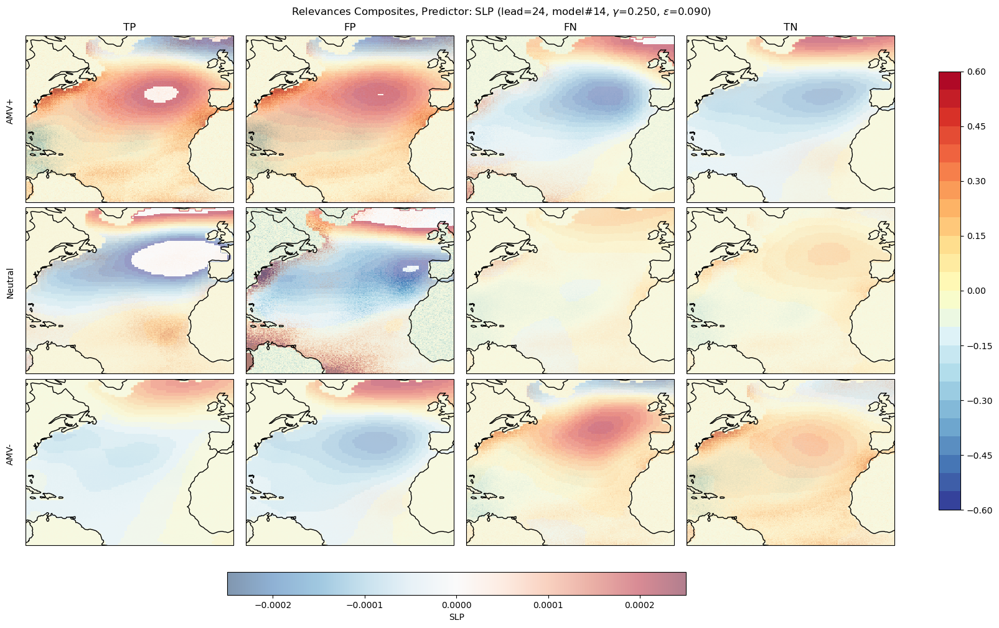

In [681]:
vmax = 0.00025
nv   = 0 # Variable INdex


vlvls = (np.arange(-.6,.65,.05),np.arange(-.6,.65,.05),np.arange(-.6,.65,.05))

for nv in range(3):
    fig,axs = plt.subplots(3,4,figsize=(16,10),constrained_layout=True,subplot_kw={'projection':ccrs.PlateCarree()})
    
    for th in range(3):
        for c in range(4):
            
            ax = axs[th,c]
            if th == 0:
                ax.set_title(cm_names[c])
            if c == 0:
                ax.text(-0.05, 0.55, thresnames[th], va='bottom', ha='center',rotation='vertical',
                            rotation_mode='anchor',transform=ax.transAxes)
                #ax.set_ylabel(vnames[th])
            
            ax.coastlines()
            plotvar = lrp_composites[th,c,nv,:,:]
            plotvar_base = x_composites[th,c,nv,:,:]
            cf  = ax.contourf(lon,lat,plotvar_base,cmap='RdYlBu_r',levels=vlvls[nv])
            pcm = ax.pcolormesh(lon,lat,plotvar,cmap='RdBu_r',vmin=-vmax,vmax=vmax,alpha=0.5)
    cb = fig.colorbar(pcm,ax=axs.flatten(),fraction=0.045,pad=0.05,orientation='horizontal')
    cb.set_label("Relevances")      
    
    cb2 = fig.colorbar(cf,ax=axs.flatten(),fraction=0.025,pad=0.05,orientation='vertical')
    cb.set_label("%s" % vnames[nv])
    
    plt.suptitle("Relevances Composites, Predictor: %s (lead=%i, model#%i, " % (vnames[nv],lead,imodel) + "$\gamma$=%.3f, $\epsilon$=%.3f)"%(gamma,epsilon) )


    savename = "%sLRP_confmat_composite_lead%i_%s_gamma%.3f_epsilon%.3f_istart%i_model%i.png" % (figpath,lead,vnames[nv],gamma,epsilon,isamples[0],imodel)
    print(savename)
    plt.savefig(savename,dpi=150,bbox_inches='tight')

In [542]:
# ypred     = y_pred
# ylabel    = y_class
# getcounts = True 
# debug     = True

# def calc_confmat(ypred,ylabel,c,getcounts=True,debug=True):
#     """
#     ypred     : [N x 1]
#     ylabel    : [N x 1]
#     c         : the class number or label, as found in ypred/ylabel
#     getcounts : Set True to return indices,counts,total_counts,accuracy
#     debug     : Set True to print debugging messages
#     """
    
#     # Getting the Counts
#     TP     = ((ypred==c) * (ylabel==c))#.sum()
#     FP     = ((ypred==c) * (ylabel!=c))#.sum()
#     TN     = ((ypred!=c) * (ylabel!=c))#.sum()
#     FN     = ((ypred!=c) * (ylabel==c))#.sum()
#     cm     = np.array([TP,FP,FN,TN],dtype='object')
#     if debug:
#         #cm = [c.sum() for c in list(cm)]
#         TP,FP,FN,TN = cm
#         print("Predict 0: %i, Actual 0: %i, TN Count: %i " % ((ypred!=c).sum(),(ylabel!=c).sum(),TN.sum())) # Check True Negative 
#         print("Predict 1: %i, Actual 1: %i, TP Count: %i " % ((ypred==c).sum(),(ylabel==c).sum(),TP.sum())) # Check True Positive
#         print("Predict 1: %i, Actual 0: %i, FP Count: %i (+ %i = %i total)" % ((ypred==c).sum(),(ylabel!=c).sum(),FP.sum(),TP.sum(),FP.sum()+TP.sum())) # Check False Positive
#         print("Predict 0: %i, Actual 1: %i, FN Count: %i (+ %i = %i total)" % ((ypred!=c).sum(),(ylabel==c).sum(),FN.sum(),TN.sum(),FN.sum()+TN.sum())) # Check False Negative
#     if getcounts: # Get counts and accuracy
#         cm_counts               = [c.sum() for c in cm]
#         count_pred_total        = np.hstack([np.ones(2)*(ypred==c).sum(),np.ones(2)*(ypred!=c).sum()]) # [totalpos,totalpos,totalneg,totalneg]
#         cm_acc                  = cm_counts / count_pred_total
#         out = [c.reshape(2,2) for c in (cm,cm_counts,count_pred_total,cm_acc)]
#         return out
#     else:
#         return cm.reshape(2,2) # Just return the boolean indices

[Text(0, 0, 'AMV+'), Text(0, 1, 'Neutral'), Text(0, 2, 'AMV-')]

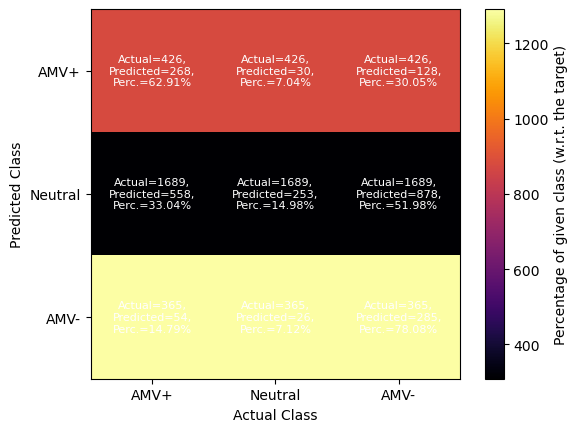

In [444]:
# Plot "CM" (not exactly confusion matrices)

fig,ax = plt.subplots(1,1)
cmtest = np.arange(9).reshape(3,3)
labels = np.array(labels).reshape(3,3)
#cmtest[0,:] = np.ones(3)*1
#im    = ax.imshow(cm.T,vmin=0,vmax=1,cmap='inferno')
im     = ax.imshow(predcount.T,cmap='inferno')
for i in range(3):
    for j in range(3):
        text = ax.text(j, i, labels[i, j],fontsize=8,
                       ha="center", va="center", color="w")
cb = fig.colorbar(im,ax=ax)
cb.set_label("Percentage of given class (w.r.t. the target)")
ax.set_xlabel("Actual Class")
ax.set_ylabel("Predicted Class")
ax.set_xticks(np.arange(3))
ax.set_yticks(np.arange(3))
ax.set_xticklabels(thresnames)
ax.set_yticklabels(thresnames)

In [437]:
62.91+7.04+30.05

100.0

In [ ]:
predc